In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

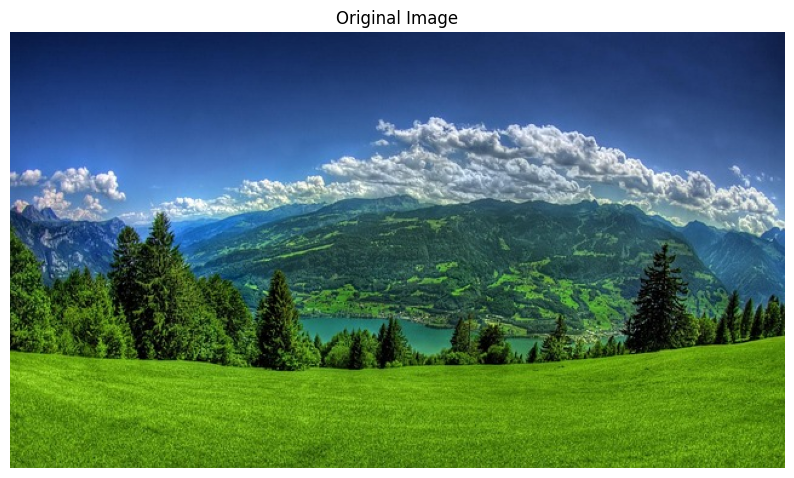

Shape: (360, 640, 3)
Range: 0 - 255


In [2]:
img = cv2.imread('nature.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.title('Original Image')
plt.axis('off')
plt.show()

print(f"Shape: {img_rgb.shape}")
print(f"Range: {img_rgb.min()} - {img_rgb.max()}")

## Part 1: Power Law Transformation (Gamma Correction)

In [3]:
# This function applies gamma correction to an image
# The formula is: s = c * r^gamma
# - if gamma < 1: it brightens the image (like taking the nth root)
# - if gamma > 1: it darkens the image (like taking the nth power)
def gamma_correction(image, c, gamma):
    """
    Apply gamma correction to brighten or darken an image.
    
    Args:
        image: the input image we want to transform
        c: scaling factor (usually 1)
        gamma: controls how we transform the intensity
            gamma < 1 -> brighter
            gamma > 1 -> darker
    """
    # First, normalize the image to 0-1 range (divide by 255)
    I_norm = image.astype('float32') / 255
    
    # Apply the power law transformation
    I_transformed = c * (I_norm ** gamma)
    
    # Make sure values don't go outside valid range
    I_transformed = np.clip(I_transformed, 0, 1)
    
    # Convert back to 0-255 range and uint8 format for display/saving
    I_transformed = (I_transformed * 255).astype('uint8')
    return I_transformed

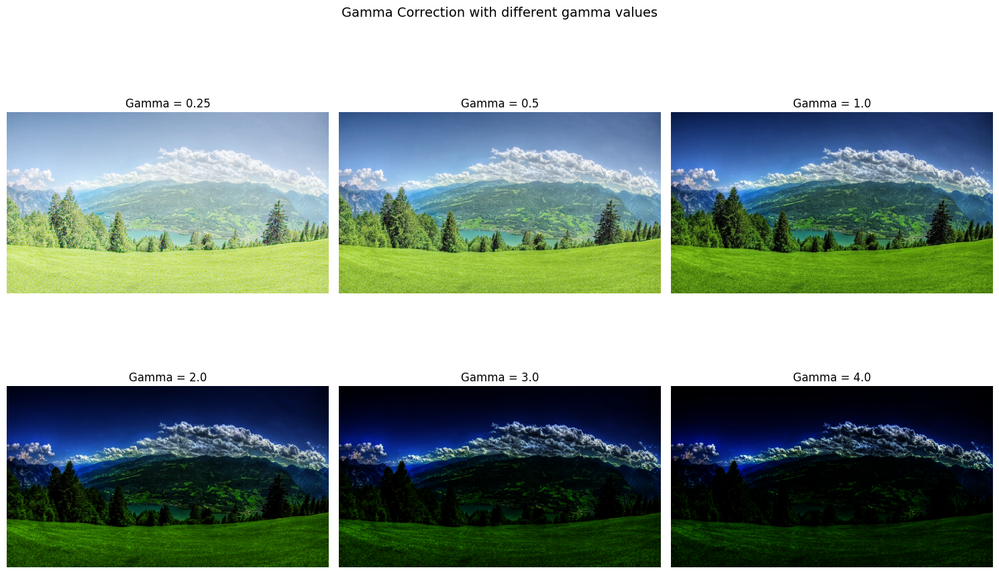

In [4]:
# Let's try different gamma values and see what happens
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

gamma_values = [0.25, 0.5, 1.0, 2.0, 3.0, 4.0]
c = 1.0

for idx, gamma in enumerate(gamma_values):
    result = gamma_correction(img_rgb, c, gamma)
    axes[idx].imshow(result)
    axes[idx].set_title(f'Gamma = {gamma}')
    axes[idx].axis('off')

plt.suptitle('Gamma Correction with different gamma values', fontsize=14)
plt.tight_layout()
plt.show()

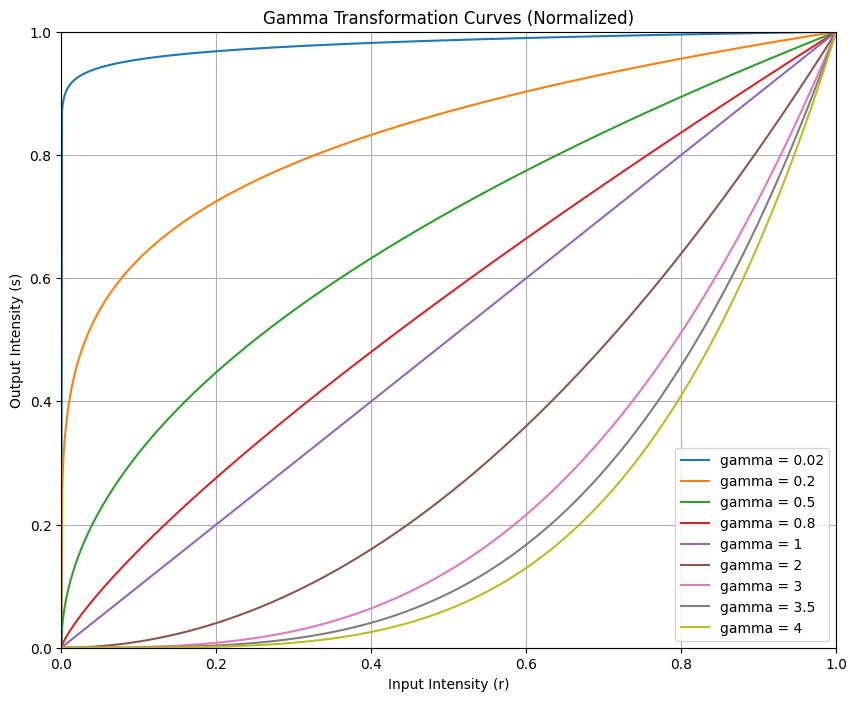

In [5]:
# Let's visualize what the gamma transformation curves look like
# This helps us understand how each gamma value affects intensity
def plot_gamma_curves():
    """Plot gamma transformation curves to visualize the effect"""
    x_norm = np.linspace(0, 1, 1000)
    gamma_values = [0.02, 0.2, 0.5, 0.8, 1, 2, 3, 3.5, 4]
    
    plt.figure(figsize=(10, 8))
    for gamma in gamma_values:
        y = x_norm ** gamma
        plt.plot(x_norm, y, label=f'gamma = {gamma}')
    
    plt.xlabel('Input Intensity (r)')
    plt.ylabel('Output Intensity (s)')
    plt.title('Gamma Transformation Curves (Normalized)')
    plt.legend()
    plt.grid(True)
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.show()

plot_gamma_curves()

## Task 1: Apply gamma correction to mesi.jpg

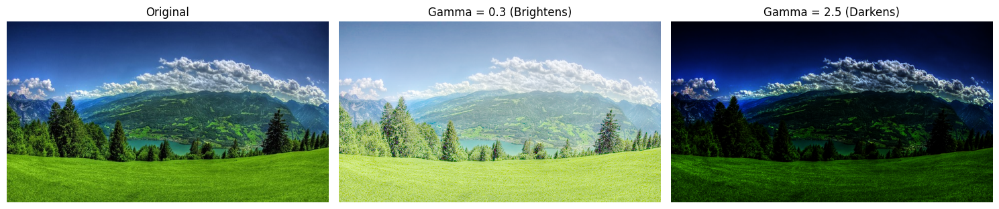

Observations:
- Gamma < 1: Brightens the image (like taking nth root)
- Gamma > 1: Darkens the image (like taking nth power)
- Gamma = 1: No change


In [6]:
# Let's compare original with brightened (gamma < 1) and darkened (gamma > 1) versions
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

original = img_rgb.copy()
gamma_low = gamma_correction(img_rgb, 1, 0.3)
gamma_high = gamma_correction(img_rgb, 1, 2.5)

axes[0].imshow(original)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(gamma_low)
axes[1].set_title('Gamma = 0.3 (Brightens)')
axes[1].axis('off')

axes[2].imshow(gamma_high)
axes[2].set_title('Gamma = 2.5 (Darkens)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# What did we learn?
print("Observations:")
print("- Gamma < 1: Brightens the image (like taking nth root)")
print("- Gamma > 1: Darkens the image (like taking nth power)")
print("- Gamma = 1: No change")

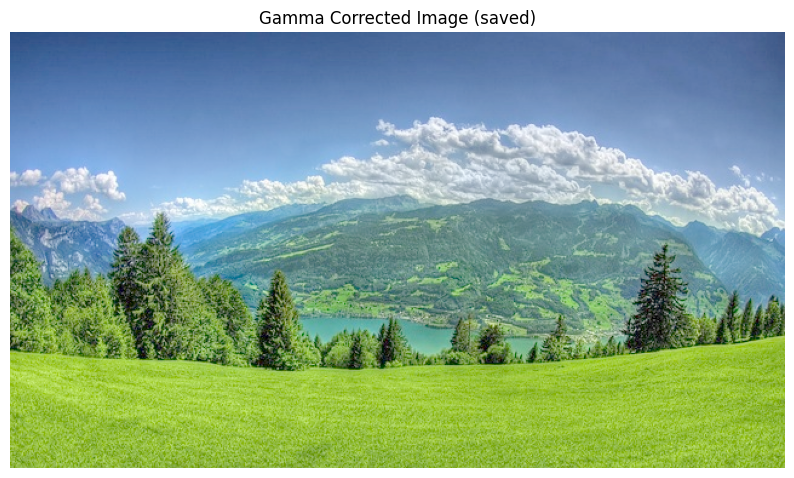

Note: Remember to multiply by 255 and convert to uint8 before saving!


In [7]:
# Let's save a gamma-corrected version
# Important: remember to convert back to BGR for OpenCV and uint8 format
result_gamma = gamma_correction(img_rgb, 1, 0.5)

# Convert RGB back to BGR for OpenCV
result_bgr = cv2.cvtColor(result_gamma, cv2.COLOR_RGB2BGR)
cv2.imwrite('/home/okaryn/codes/python/CV/IPI/LAB4/mesi_gamma_corrected.jpg', result_bgr)

plt.figure(figsize=(10, 8))
plt.imshow(result_gamma)
plt.title('Gamma Corrected Image (saved)')
plt.axis('off')
plt.show()

print("Note: Remember to multiply by 255 and convert to uint8 before saving!")

## Part 2: Contrast Stretching

In [8]:
def contrast_stretching(image_in, smax, smin):
    rmin = image_in.min()
    rmax = image_in.max()
    
    if rmax == rmin:
        return image_in
    
    result = ((smax - smin) / (rmax - rmin)) * (image_in.astype('float32') - rmin) + smin
    # bug here - should be 255 not 254
    result = np.clip(result, 0, 254).astype('uint8')
    
    return result

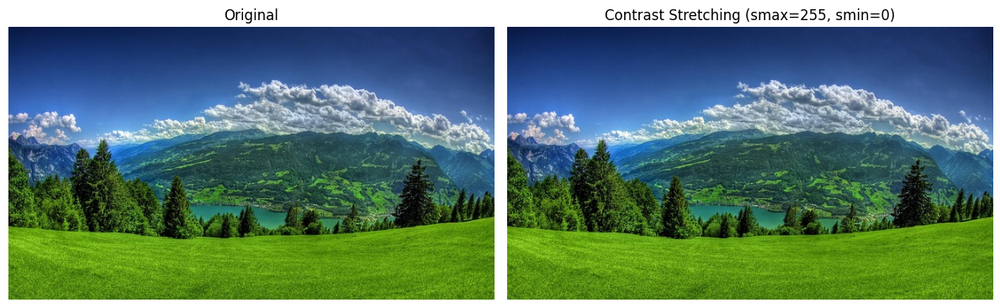

Original range: 0 - 255
Output range: 0 - 254


In [9]:
# Let's see the basic effect of contrast stretching
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

result_non_norm = contrast_stretching(img_rgb, smax=255, smin=0)

axes[0].imshow(img_rgb)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(result_non_norm)
axes[1].set_title('Contrast Stretching (smax=255, smin=0)')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Original range: {img_rgb.min()} - {img_rgb.max()}")
print(f"Output range: {result_non_norm.min()} - {result_non_norm.max()}")

## Task 2: Contrast Stretching with different parameters

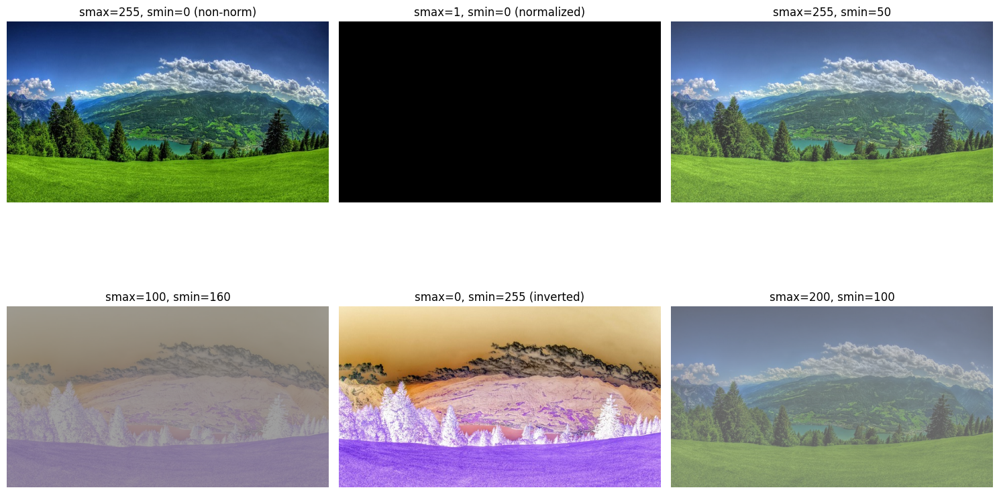

In [10]:
# Let's try different combinations of smax and smin
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

params = [
    (255, 0, 'smax=255, smin=0 (non-norm)'),
    (1, 0, 'smax=1, smin=0 (normalized)'),
    (255, 50, 'smax=255, smin=50'),
    (100, 160, 'smax=100, smin=160'),
    (0, 255, 'smax=0, smin=255 (inverted)'),
    (200, 100, 'smax=200, smin=100'),
]

for idx, (smax, smin, title) in enumerate(params):
    result = contrast_stretching(img_rgb, smax, smin)
    ax = axes[idx // 3, idx % 3]
    ax.imshow(result)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

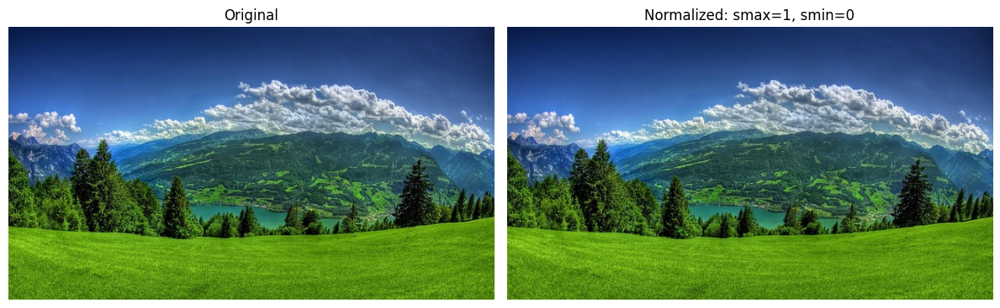

Impact of normalization:
- Normalized output has values in [0,1] range, easier to work with for some operations
- Non-normalized works directly with 0-255 range
- Both produce similar visual results when properly scaled


In [11]:
# For normalized images (0-1 range), we need a slightly different version
def contrast_stretching_normalized(image_in, smax, smin):
    """
    Apply contrast stretching to a normalized image (values between 0 and 1).
    """
    # First normalize the image to 0-1 range
    image_norm = image_in.astype('float32') / 255.0
    rmin = image_norm.min()
    rmax = image_norm.max()
    
    if rmax == rmin:
        return image_in
    
    # Apply the formula
    result = ((smax - smin) / (rmax - rmin)) * (image_norm - rmin) + smin
    result = np.clip(result, 0, 1)
    result = (result * 255).astype('uint8')
    
    return result

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

result_norm = contrast_stretching_normalized(img_rgb, smax=1, smin=0)

axes[0].imshow(img_rgb)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(result_norm)
axes[1].set_title('Normalized: smax=1, smin=0')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Let's discuss the impact of normalization
print("Impact of normalization:")
print("- Normalized output has values in [0,1] range, easier to work with for some operations")
print("- Non-normalized works directly with 0-255 range")
print("- Both produce similar visual results when properly scaled")

## Summary and Analysis

In [12]:
# Let's summarize what we've learned
print("="*60)
print("SUMMARY OF INTENSITY TRANSFORMATION TECHNIQUES")
print("="*60)

print("\n1. GAMMA CORRECTION (Power Law Transformation)")
print("-" * 40)
print("Formula: s = c * r^γ")
print("- Gamma < 1: Brightens dark images (nth root)")
print("- Gamma > 1: Darkens bright images (nth power)")
print("- Gamma = 1: No change (identity transformation)")
print("\nUse cases:")
print("- Display calibration (monitors have gamma ~2.2)")
print("- Enhancing dark/washed out images")
print("- Image compression pre-processing")

print("\n2. CONTRAST STRETCHING")
print("-" * 40)
print("Formula: s = ((smax-smin)/(rmax-rmin)) * (r-rmin) + smin")
print("- Expands the range of intensity values in an image")
print("- smax and smin define the output range")
print("- rmin and rmax are automatically computed from input")
print("\nUse cases:")
print("- Improving low contrast images")
print("- Enhancing details in washed-out images")
print("- Pre-processing for better feature extraction")

print("\n" + "="*60)

SUMMARY OF INTENSITY TRANSFORMATION TECHNIQUES

1. GAMMA CORRECTION (Power Law Transformation)
----------------------------------------
Formula: s = c * r^γ
- Gamma < 1: Brightens dark images (nth root)
- Gamma > 1: Darkens bright images (nth power)
- Gamma = 1: No change (identity transformation)

Use cases:
- Display calibration (monitors have gamma ~2.2)
- Enhancing dark/washed out images
- Image compression pre-processing

2. CONTRAST STRETCHING
----------------------------------------
Formula: s = ((smax-smin)/(rmax-rmin)) * (r-rmin) + smin
- Expands the range of intensity values in an image
- smax and smin define the output range
- rmin and rmax are automatically computed from input

Use cases:
- Improving low contrast images
- Enhancing details in washed-out images
- Pre-processing for better feature extraction



## Part 3: Image Flipping

In [13]:
def flip_horizontal(image):
    return np.fliplr(image)

def flip_vertical(image):
    return np.flipud(image)

def flip_mirror(image):
    # copy paste error - should be fliplr not flipud
    return np.flipud(image)

## Part 4: Image Negative

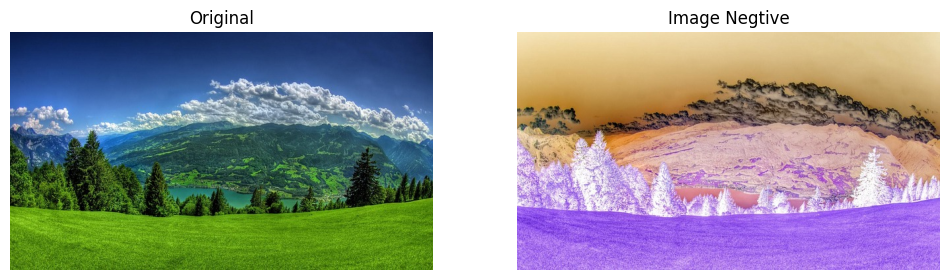

In [14]:
# Image negative transformation
def image_negative(image):
    return 255 - image

# Test with mesi
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(img_rgb)
axes[0].set_title('Original')
axes[0].axis('off')

negative = image_negative(img_rgb)
axes[1].imshow(negative)
axes[1].set_title('Image Negtive')
axes[1].axis('off')

plt.show()

## Part 5: Intensity Range Transfomation

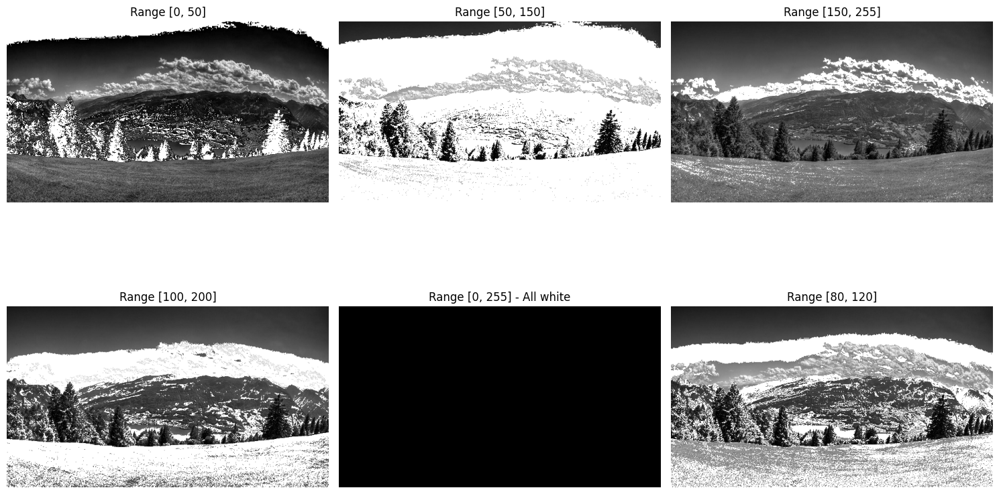

In [15]:
# Intensity range transformation
# Assign L-1 (255) to intensities in range [A, B]
def intensity_range_transform(image, A, B, L=256):
    """
    Apply intensity transformation for range [A, B].
    Intensities in [A, B] are set to L-1 (255), others remain unchanged.
    
    Args:
        image: input image
        A: start of range
        B: end of range
        L: max intensity level (default 256 for 8-bit)
    """
    result = image.copy()
    # Find indices where intensity is in range [A, B]
    mask = (image >= A) & (image <= B)
    result[mask] = L - 1
    return result

# Test with different ranges
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

ranges = [
    (0, 50, 'Range [0, 50]'),
    (50, 150, 'Range [50, 150]'),
    (150, 255, 'Range [150, 255]'),
    (100, 200, 'Range [100, 200]'),
    (0, 255, 'Range [0, 255] - All white'),
    (80, 120, 'Range [80, 120]'),
]

# Use grayscale for better visualization
gray_img = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

for idx, (A, B, title) in enumerate(ranges):
    result = intensity_range_transform(gray_img, A, B)
    ax = axes[idx // 3, idx % 3]
    ax.imshow(result, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

## Part 6: Bit-Plane Slicing

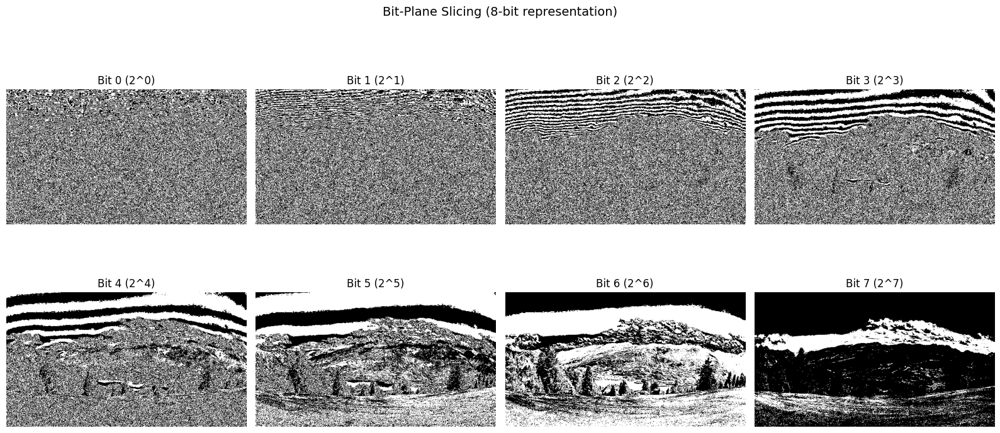

In [16]:
# Bit-plane slicing
# Display all 8 bit planes of an image
def display_bit_response(image):
    """
    Display all 8 bit planes of an image.
    Each bit plane shows which pixels have that bit set.
    """
    # Convert to grayscale if color
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    
    for bit_position in range(8):
        # Extract bit plane using bitwise AND
        # (1 << bit_position) creates a mask like 1, 2, 4, 8, 16, 32, 64, 128
        bit_plane = (gray >> bit_position) & 1
        # Convert to 0-255 for display
        bit_plane_display = bit_plane * 255
        
        axes[bit_position].imshow(bit_plane_display, cmap='gray')
        axes[bit_position].set_title(f'Bit {bit_position} (2^{bit_position})')
        axes[bit_position].axis('off')
    
    plt.suptitle('Bit-Plane Slicing (8-bit representation)', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return

# Display bit planes for mesi image
display_bit_response(img_rgb)

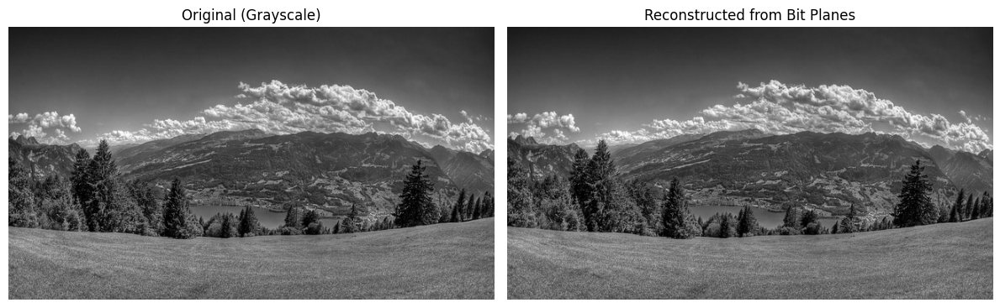

Original equals reconstructed: True


In [17]:
# Reconstruct image from bit planes
def reconstruct_from_bitplanes(image):
    """
    Reconstruct image from its bit planes.
    Demonstrates that adding all bit planes gives back the original.
    """
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    reconstructed = np.zeros_like(gray, dtype=np.float64)
    
    for bit_position in range(8):
        bit_plane = (gray >> bit_position) & 1
        reconstructed += bit_plane * (2 ** bit_position)
    
    return reconstructed.astype(np.uint8)

# Verify reconstruction
reconstructed = reconstruct_from_bitplanes(img_rgb)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

gray_original = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

axes[0].imshow(gray_original, cmap='gray')
axes[0].set_title('Original (Grayscale)')
axes[0].axis('off')

axes[1].imshow(reconstructed, cmap='gray')
axes[1].set_title('Reconstructed from Bit Planes')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Original equals reconstructed: {np.array_equal(gray_original, reconstructed)}")

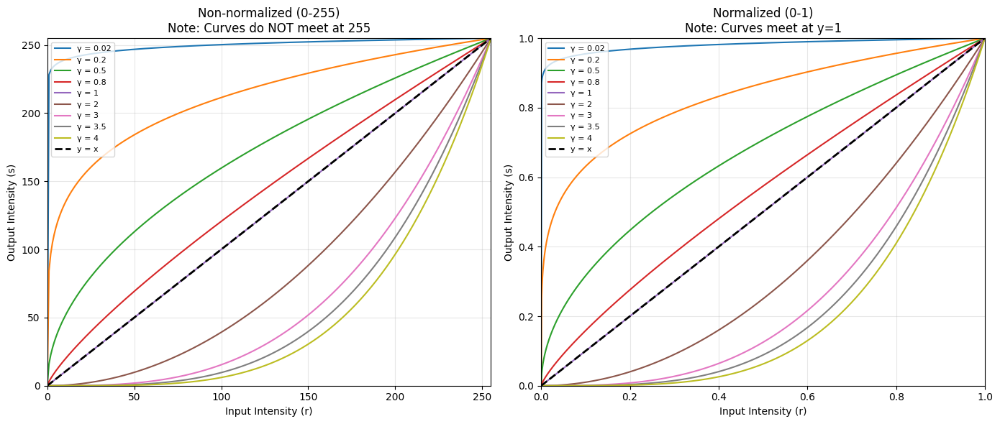

Key observations:
- Non-normalized: Curves do NOT meet at y=255 because r^γ is always <= 1
  So max output is c*1 = 255, but after scaling back, curves converge differently
- Normalized: Curves meet at y=1 because 1^γ = 1 for any γ


In [18]:
# Compare gamma curves for normalized and non-normalized cases
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Non-normalized (0-255)
x_non_norm = np.arange(0, 256)
gamma_values = [0.02, 0.2, 0.5, 0.8, 1, 2, 3, 3.5, 4]

ax1 = axes[0]
for gamma in gamma_values:
    y = (x_non_norm / 255) ** gamma * 255
    ax1.plot(x_non_norm, y, label=f'γ = {gamma}')

ax1.plot([0, 255], [0, 255], 'k--', label='y = x', linewidth=2)
ax1.set_xlabel('Input Intensity (r)')
ax1.set_ylabel('Output Intensity (s)')
ax1.set_title('Non-normalized (0-255)\nNote: Curves do NOT meet at 255')
ax1.legend(loc='upper left', fontsize=8)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(0, 255)
ax1.set_ylim(0, 255)

# Normalized (0-1)
x_norm = np.linspace(0, 1, 1000)

ax2 = axes[1]
for gamma in gamma_values:
    y = x_norm ** gamma
    ax2.plot(x_norm, y, label=f'γ = {gamma}')

ax2.plot([0, 1], [0, 1], 'k--', label='y = x', linewidth=2)
ax2.set_xlabel('Input Intensity (r)')
ax2.set_ylabel('Output Intensity (s)')
ax2.set_title('Normalized (0-1)\nNote: Curves meet at y=1')
ax2.legend(loc='upper left', fontsize=8)
ax2.grid(True, alpha=0.3)
ax2.set_xlim(0, 1)
ax2.set_ylim(0, 1)

plt.tight_layout()
plt.show()

print("Key observations:")
print("- Non-normalized: Curves do NOT meet at y=255 because r^γ is always <= 1")
print("  So max output is c*1 = 255, but after scaling back, curves converge differently")
print("- Normalized: Curves meet at y=1 because 1^γ = 1 for any γ")